# Loading datasets, creating answer vocabulary, and sample data distribution visualizations

## Loading datasets

In [58]:
from datasets import load_dataset

train_dataset = load_dataset("json", data_files="/kaggle/input/vizwiz/Annotations/Annotations/train.json")
val_dataset = load_dataset("json", data_files="/kaggle/input/vizwiz/Annotations/Annotations/val.json")
test_dataset = load_dataset("json", data_files="/kaggle/input/vizwiz/Annotations/Annotations/test.json")

In [37]:
# Checking attributes and number of examples in all three datasets

print(train_dataset)
print(val_dataset)
print(test_dataset)

DatasetDict({
    train: Dataset({
        features: ['image', 'question', 'answers', 'answer_type', 'answerable'],
        num_rows: 20523
    })
})
DatasetDict({
    train: Dataset({
        features: ['image', 'question', 'answers', 'answer_type', 'answerable'],
        num_rows: 4319
    })
})
DatasetDict({
    train: Dataset({
        features: ['image', 'question'],
        num_rows: 8000
    })
})


## Creating answer vocabulary

In [3]:
# Collecting every distinct answer in the training and validation datasets
# and counting their frequency of occurence 

answer_frequency = {}

for example in train_dataset['train']:
    for answer_obj in example['answers']:
        if answer_obj['answer'] not in answer_frequency:
            answer_frequency[answer_obj['answer']] = 1
        else:
            answer_frequency[answer_obj['answer']] += 1
            
for example in val_dataset['train']:
    for answer_obj in example['answers']:
        if answer_obj['answer'] not in answer_frequency:
            answer_frequency[answer_obj['answer']] = 1
        else:
            answer_frequency[answer_obj['answer']] += 1
            
print(f"Number of distinct answers = {len(answer_frequency)}")

Number of distinct answers = 48730


In [2]:
pip install python-Levenshtein

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 177.4/177.4 kB 3.2 MB/s eta 0:00:00a 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.4/3.4 MB 42.2 MB/s eta 0:00:0000:0100:01
Note: you may need to restart the kernel to use updated packages.


In [4]:
# Function used to choose a target answer for each example out of the 10 given answers.
# and adding this answer to the answers vocabulary(answer_dict).

# Policy for choosing an answer out of the 10 given answers:
# 1) Select the answer with the heighest frequency among all 10 answers.
# 2) If a tie is found, select answer with heighest frequency of occurence in all examples.
# 3) If another tie is found, measure the Levenshtein distance between each answer and all other tied answers,
#    select answer with least Levenshtein distance.

# This policy yields an answer vocabulary of 5731 answers.

import Levenshtein
import numpy as np

def expand_answers_vocab(example):
    answers = example['answers']
    plausible_answers = []
    answer_freq = {}
    
    for answer_obj in answers:
        if answer_obj['answer_confidence'] == 'yes':
            plausible_answers.append(answer_obj['answer'])
        
    if len(plausible_answers) == 0:
        for answer_obj in answers:
            if answer_obj['answer_confidence'] == 'maybe':
                plausible_answers.append(answer_obj['answer'])
    
    # 1) Select the answer with the heighest frequency among all 10 answers.
    for ans in plausible_answers:
        if ans not in answer_freq:
            answer_freq[ans] = 1
        else:
            answer_freq[ans] += 1

    answer_freq = sorted(answer_freq.items(), key=lambda x:x[1], reverse=True)
    first_phase_top_answers = []
    top_freq = answer_freq[0][1]
    
    for answer in answer_freq:
        if answer[1] == top_freq:
            first_phase_top_answers.append(answer[0])
    
    if len(first_phase_top_answers) == 1:
        chosen_answer = first_phase_top_answers[0]
        
    else:
        # 2) If a tie is found, select answer with heighest frequency of occurence in all examples.
        second_phase_top_answers = []
        highest_dataset_freq = 0
        
        for answer in first_phase_top_answers:
            if answer_frequency[answer] > highest_dataset_freq:
                highest_dataset_freq = answer_frequency[answer]
        for answer in first_phase_top_answers:
            if answer_frequency[answer] == highest_dataset_freq:
                second_phase_top_answers.append(answer)
        
        if len(second_phase_top_answers) == 1:
            chosen_answer = second_phase_top_answers[0]
        
        else:
            # 3) If another tie is found, measure the Levenshtein distance between each answer and all other tied answers,
            #    select answer with least Levenshtein distance.
            min_lev_distance = np.inf
            for answer_a in second_phase_top_answers:
                answer_total_lev_distances = 0
                for answer_b in second_phase_top_answers:
                    if answer_a != answer_b:
                        answer_total_lev_distances += Levenshtein.distance(answer_a, answer_b)
                    
                if answer_total_lev_distances < min_lev_distance:
                    min_lev_distance = answer_total_lev_distances
                    chosen_answer = answer_a
        
    if chosen_answer not in answer_dict:
        answer_dict[chosen_answer] = 1
    else:
        answer_dict[chosen_answer] += 1
        
    example['chosen_answer'] = chosen_answer
    return example

In [ ]:
answer_dict = {}
answer_to_index = {}
index_to_answer = {}

train_dataset['train'] = train_dataset['train'].map(expand_answers_vocab)
val_dataset['train'] = val_dataset['train'].map(expand_answers_vocab)
    
answer_dict = sorted(answer_dict.items(), key=lambda x:x[1], reverse=True)

i = 0
for key, value in answer_dict:
    answer_to_index[key] = i
    index_to_answer[i] = key
    i += 1

In [60]:
print(f"Total number of classes in answer vocabulary: {len(index_to_answer)}")

Total number of classes in answer vocabulary: 5731


In [11]:
# Mapping all four answer types to indices and vice versa.
# These answer types will be used to create answer gates that mask the final probability distribution over answers. 

answer_type_to_index = {}
index_to_answer_type = {}

answer_type_to_index['other'] = 0
answer_type_to_index['yes/no'] = 1
answer_type_to_index['unanswerable'] = 2
answer_type_to_index['number'] = 3

index_to_answer_type[0] = 'other'
index_to_answer_type[1] = 'yes/no'
index_to_answer_type[2] = 'unanswerable'
index_to_answer_type[3] = 'number'

## Getting image and question encodings from train_dataset and val_dataset

In [ ]:
# Functions used to get image and question encodings for saving and later use.

import tensorflow as tf
from transformers import AutoProcessor, AutoTokenizer, CLIPModel
from PIL import Image
import pandas as pd
import pickle
from datasets import concatenate_datasets

model = CLIPModel.from_pretrained("openai/clip-vit-base-patch32")
processor = AutoProcessor.from_pretrained("openai/clip-vit-base-patch32")
tokenizer = AutoTokenizer.from_pretrained("openai/clip-vit-base-patch32")

def get_encodings_train(entry):
    path = f"/kaggle/input/vizwiz/train/train/{entry['image']}"
    
    image_inputs = processor(images=Image.open(path), return_tensors="pt")
    image_encoding = model.get_image_features(**image_inputs)
    entry['image_encoding'] = image_encoding
    
    question_inputs = tokenizer([entry['question']], padding=True, return_tensors="pt")
    entry['question_encoding'] = model.get_text_features(**question_inputs)
    return entry

def get_encodings_val(entry):
    path = f"/kaggle/input/vizwiz/val/val/{entry['image']}"
    
    image_inputs = processor(images=Image.open(path), return_tensors="pt")
    image_encoding = model.get_image_features(**image_inputs)
    
    entry['image_encoding'] = image_encoding
    
    question_inputs = tokenizer([entry['question']], padding=True, return_tensors="pt")
    entry['question_encoding'] = model.get_text_features(**question_inputs)
    return entry

def answer_type_indices(entry):
    entry['answer_type_index'] = tf.one_hot(answer_type_to_index[entry['answer_type']], depth=4)
    entry['answerable'] = [entry['answerable']]
    
    return entry

In [ ]:
# Getting image encodings, question encodings, anser type indices of train_dataset and val_datasets.
start = 0
end = 50
while end != 20500:
    print(f"Train examples {start} - {end}")
    single_train = train_dataset['train'].select(range(start, end)).map(answer_type_indices).map(get_encodings_train).remove_columns(['answers'])
    if start == 0:
        new_train = single_train
    else:
        new_train = concatenate_datasets([new_train, single_train])
    
    start += 50
    end += 50
single_train = train_dataset['train'].select(range(20500, 20523)).map(answer_type_indices).map(get_encodings_train).remove_columns(['answers'])
new_train = concatenate_datasets([new_train, single_train])
    
start = 0
end = 50
while end != 4300:
    print(f"Val examples {start} - {end}")
    single_val = val_dataset['train'].select(range(start, end)).map(answer_type_indices).map(get_encodings_val).remove_columns(['answers'])
    if start == 0:
        new_val = single_val
    else:
        new_val = concatenate_datasets([new_val, single_val])
    
    start += 50
    end += 50
single_val = val_dataset['train'].select(range(4300, 4319)).map(answer_type_indices).map(get_encodings_val).remove_columns(['answers'])
new_val= concatenate_datasets([new_val, single_val])

In [ ]:
train_dataset = new_train
val_dataset = new_val

## Saving and loading datasets with image and question encodings

In [ ]:
# Saving training and validation datasets with encodings.

import json

def save_dataset_as_json(dataset, file_name):
    # Convert the dataset to a list of dictionaries
    dataset_list = dataset.to_dict()

    # Save to a JSON file
    with open(file_name, 'w') as json_file:
        json.dump(dataset_list, json_file, indent=4)

save_dataset_as_json(new_train, 'train_encoded_dataset_newest.json')
save_dataset_as_json(new_val, 'val_encoded_dataset_newest.json')

In [ ]:
# Loading previously training and validation datasets with encodings.

from datasets import load_dataset

loaded_train_dataset = load_dataset("json", data_files="/kaggle/input/vqa-encoded-datasets/train_encoded_dataset_newest.json")['train']
loaded_val_dataset = load_dataset("json", data_files="/kaggle/input/vqa-encoded-datasets/val_encoded_dataset_newest.json")['train']

In [ ]:
# Adding all 10 answers, chosen answer from the original train_dataset and val_dataset, then creating answer index.

import tensorflow as tf

def add_answers_train(example, idx):
    example['answers'] = train_dataset['train'][idx]['answers']
    example['chosen_answer'] = train_dataset['train'][idx]['chosen_answer']
    example['answer_index'] = tf.one_hot(answer_to_index[example['chosen_answer']], depth=5731)
    return example
def add_answers_val(example, idx):
    example['answers'] = val_dataset['train'][idx]['answers']
    example['chosen_answer'] = val_dataset['train'][idx]['chosen_answer']
    example['answer_index'] = tf.one_hot(answer_to_index[example['chosen_answer']], depth=5731)
    return example

loaded_train_dataset= loaded_train_dataset.select(range(20450)).map(add_answers_train, with_indices=True)
loaded_val_dataset= loaded_val_dataset.select(range(4250)).map(add_answers_val, with_indices=True)

In [62]:
# Overwritting train_dataset and val_dataset.

train_dataset = loaded_train_dataset
val_dataset = loaded_val_dataset

In [64]:
print(train_dataset)
print(val_dataset)

Dataset({
    features: ['image', 'question', 'answer_type', 'answerable', 'chosen_answer', 'answer_index', 'answer_type_index', 'image_encoding', 'question_encoding', 'answers'],
    num_rows: 20450
})
Dataset({
    features: ['image', 'question', 'answer_type', 'answerable', 'chosen_answer', 'answer_index', 'answer_type_index', 'image_encoding', 'question_encoding', 'answers'],
    num_rows: 4250
})


## Some visualizations of answers distribution in training data and validation data

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1765: FutureWarning: unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.
  order = pd.unique(vector)


Class distribution for training examples 1->500


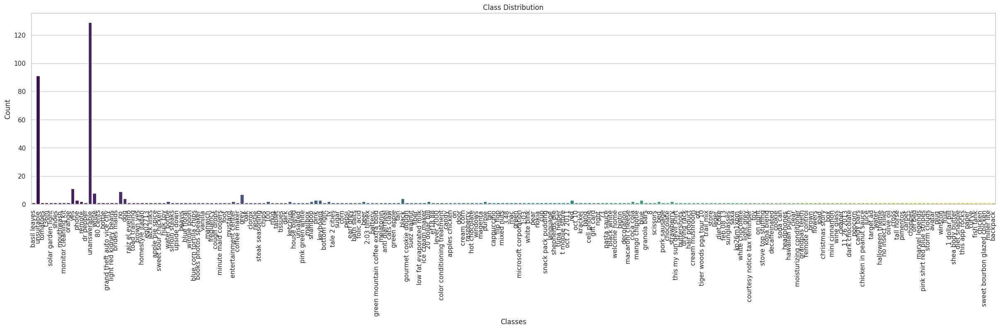

In [65]:
# Sample of training data answers distribution.

import seaborn as sns
import matplotlib.pyplot as plt

sns.set(style='whitegrid')

plt.figure(figsize=(30, 6))
sns.countplot(x='chosen_answer', data=train_dataset[:500], palette='viridis')

plt.title('Class Distribution')
plt.xlabel('Classes')
plt.ylabel('Count')

plt.xticks(rotation=90)

print("Class distribution for training examples 1->500")
plt.show()

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1765: FutureWarning: unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.
  order = pd.unique(vector)


Class distribution for validation examples 1000->1500


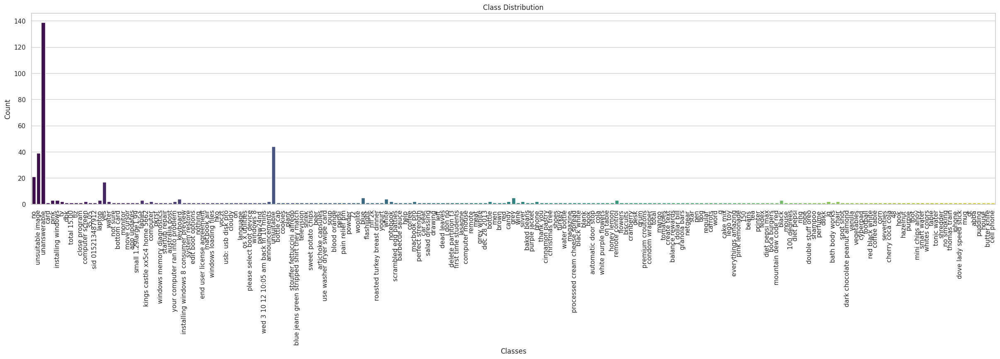

In [69]:
# Sample of validation data answers distribution.

import seaborn as sns
import matplotlib.pyplot as plt

sns.set(style='whitegrid')

plt.figure(figsize=(30, 6))
sns.countplot(x='chosen_answer', data=val_dataset[1000:1500], palette='viridis')

plt.title('Class Distribution')
plt.xlabel('Classes')
plt.ylabel('Count')

plt.xticks(rotation=90)

print("Class distribution for validation examples 1000->1500")
plt.show()

## Notes on data distribution

***As is noticed from the distributions above, both training and validation datasets are heavily imbalanced, with the 3 classes unanswerable, unsuitable, and unsuitable image being overly represented with a large number of examples, in comparison to most of the other answers, which are represented by only one or a few examples.***

# Preparing data for Tensorflow model

In [17]:
import tensorflow as tf

tf_train_dataset = train_dataset.to_tf_dataset(
    columns=['image_encoding', 'question_encoding'], 
    label_cols=['answer_index', 'answer_type_index', 'answerable'], 
    batch_size=16, 
    shuffle=True  
)
tf_val_dataset = val_dataset.to_tf_dataset(
    columns=['image_encoding', 'question_encoding'], 
    label_cols=['answer_index', 'answer_type_index', 'answerable'], 
    batch_size=16, 
    shuffle=True  
)

In [18]:
import numpy as np

# Extract features and labels from tf_train_dataset
train_X_image, train_X_question, train_Y_main, train_Y_aux, train_Y_answerable = [], [], [], [], []

for inputs, outputs in tf_train_dataset:
    train_X_image.append(inputs['image_encoding'].numpy())
    train_X_question.append(inputs['question_encoding'].numpy())
    train_Y_main.append(outputs['answer_index'].numpy())
    train_Y_aux.append(outputs['answer_type_index'].numpy())
    train_Y_answerable.append(outputs['answerable'].numpy())

# Convert lists to numpy arrays
train_X_image = np.concatenate(train_X_image, axis=0)
train_X_question = np.concatenate(train_X_question, axis=0)
train_Y_main = np.concatenate(train_Y_main, axis=0)
train_Y_aux = np.concatenate(train_Y_aux, axis=0)
train_Y_answerable = np.concatenate(train_Y_answerable, axis=0)

# Repeat for validation dataset
val_X_image, val_X_question, val_Y_main, val_Y_aux, val_Y_answerable = [], [], [], [], []

for inputs, outputs in tf_val_dataset:
    val_X_image.append(inputs['image_encoding'].numpy())
    val_X_question.append(inputs['question_encoding'].numpy())
    val_Y_main.append(outputs['answer_index'].numpy())
    val_Y_aux.append(outputs['answer_type_index'].numpy())
    val_Y_answerable.append(outputs['answerable'].numpy())

# Convert lists to numpy arrays
val_X_image = np.concatenate(val_X_image, axis=0)
val_X_question = np.concatenate(val_X_question, axis=0)
val_Y_main = np.concatenate(val_Y_main, axis=0)
val_Y_aux = np.concatenate(val_Y_aux, axis=0)
val_Y_answerable = np.concatenate(val_Y_answerable, axis=0)

# Model architecture

In [51]:
import tensorflow as tf

input1 = tf.keras.Input(shape=(1, 512), name='image_encoding');
input2 = tf.keras.Input(shape=(1, 512), name='question_encoding');
concatenate = tf.keras.layers.Concatenate(name='concatenate')([input1, input2]);
linear_norm = tf.keras.layers.BatchNormalization()(concatenate);
linear_dropout = tf.keras.layers.Dropout(0.5)(linear_norm)

answerable_linear = tf.keras.layers.Dense(units=1, activation='sigmoid', name='answerability_output')(linear_dropout);
reshaped_answerability = tf.keras.layers.Reshape((1,), name='answerability_output_reshaped')(answerable_linear) # shape -> (None, 1)

aux_layer = tf.keras.layers.Dense(units=4, activation='softmax', name='aux_layer')(linear_dropout);
reshaped_aux = tf.keras.layers.Reshape((4,), name='aux_output')(aux_layer) # shape -> (None, 4)
answer_gates = tf.keras.layers.Dense(units=5731, activation='softmax', name='answer_types_proj')(aux_layer);

unmasked_answer_linear = tf.keras.layers.Dense(units=5731, activation='softmax', name='unmasked_answer_linear')(linear_dropout); # shape -> (None, 1, 5731)
masked_answer = tf.keras.layers.Multiply(name='masked_answer')([unmasked_answer_linear, answer_gates]);

reshaped_output = tf.keras.layers.Reshape((5731,), name='main_output')(masked_answer) # shape -> (None, 5731)

## Model instantiation

In [52]:
vqa_tensorflow = tf.keras.Model(inputs=[input1, input2], outputs=[reshaped_output, reshaped_aux, reshaped_answerability]);
vqa_tensorflow.compile(
    optimizer='adam',
    loss={
        'main_output': 'categorical_crossentropy',  
        'aux_output': 'categorical_crossentropy',
        'answerability_output_reshaped': 'binary_crossentropy'
    },
    metrics={
        'main_output': 'accuracy', 
        'aux_output': 'accuracy',
        'answerability_output_reshaped': 'accuracy'
    }
)
vqa_tensorflow.summary()

Model: "functional_17"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ image_encoding      │ (None, 1, 512)    │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ question_encoding   │ (None, 1, 512)    │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate         │ (None, 1, 1024)   │          0 │ image_encoding[0… │
│ (Concatenate)       │                   │            │ question_encodin… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 1, 1024)   │      4,096 │ concatenate[0][0] │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_9 (Dropout) │ (None, 1, 1024)   │          0 │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ aux_layer (Dense)   │ (None, 1, 4)      │      4,100 │ dropout_9[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ unmasked_answer_li… │ (None, 1, 5731)   │  5,874,275 │ dropout_9[0][0]   │
│ (Dense)             │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ answer_types_proj   │ (None, 1, 5731)   │     28,655 │ aux_layer[0][0]   │
│ (Dense)             │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ masked_answer       │ (None, 1, 5731)   │          0 │ unmasked_answer_… │
│ (Multiply)          │                   │            │ answer_types_pro… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ answerability_outp… │ (None, 1, 1)      │      1,025 │ dropout_9[0][0]   │
│ (Dense)             │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ main_output         │ (None, 5731)      │          0 │ masked_answer[0]… │
│ (Reshape)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ aux_output          │ (None, 4)         │          0 │ aux_layer[0][0]   │
│ (Reshape)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ answerability_outp… │ (None, 1)         │          0 │ answerability_ou… │
│ (Reshape)           │                   │            │                   │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 5,912,151 (22.55 MB)

 Trainable params: 5,910,103 (22.55 MB)

 Non-trainable params: 2,048 (8.00 KB)

## Training loop

In [53]:
class CustomLogger(tf.keras.callbacks.Callback):
    def on_epoch_end(self, epoch, logs=None):
        metrics_dict = {}
        logs = logs or {}
        print(f"\n\nEpoch {epoch + 1}:")
        
        for metric, value in logs.items():
            metrics_dict[metric] = value
            
        print("Training data metrics:---------------")
        print(f"Total loss = {metrics_dict['loss']:.4f}")
        print(f"Main output accuracy = {metrics_dict['main_output_accuracy']:.4f}")
        print(f"Aux output accuracy = {metrics_dict['aux_output_accuracy']:.4f}")
        print(f"Answerability accuracy = {metrics_dict['answerability_output_reshaped_accuracy']:.4f}")
        print("Validation data metrics:-------------")
        print(f"Total loss = {metrics_dict['val_loss']:.4f}")
        print(f"Main output accuracy = {metrics_dict['val_main_output_accuracy']:.4f}")
        print(f"Aux output accuracy = {metrics_dict['val_aux_output_accuracy']:.4f}")
        print(f"Answerability accuracy = {metrics_dict['val_answerability_output_reshaped_accuracy']:.4f}")
        print()
    
history = vqa_tensorflow.fit(
    [train_X_image, train_X_question],
    [train_Y_main, train_Y_aux, train_Y_answerable],
    validation_data=([val_X_image, val_X_question], [val_Y_main, val_Y_aux, val_Y_answerable]),
    epochs=50,
    #callbacks=[CustomLogger()]
)

Epoch 1/50
640/640 ━━━━━━━━━━━━━━━━━━━━ 11s 10ms/step - answerability_output_reshaped_accuracy: 0.6969 - aux_output_accuracy: 0.6147 - loss: 8.3749 - main_output_accuracy: 0.1880 - val_answerability_output_reshaped_accuracy: 0.7944 - val_aux_output_accuracy: 0.7607 - val_loss: 5.5814 - val_main_output_accuracy: 0.3362
Epoch 2/50
640/640 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - answerability_output_reshaped_accuracy: 0.7890 - aux_output_accuracy: 0.7395 - loss: 4.7554 - main_output_accuracy: 0.3592 - val_answerability_output_reshaped_accuracy: 0.7962 - val_aux_output_accuracy: 0.7598 - val_loss: 5.5299 - val_main_output_accuracy: 0.3609
Epoch 3/50
640/640 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - answerability_output_reshaped_accuracy: 0.7952 - aux_output_accuracy: 0.7589 - loss: 3.2588 - main_output_accuracy: 0.4937 - val_answerability_output_reshaped_accuracy: 0.7969 - val_aux_output_accuracy: 0.7664 - val_loss: 5.6232 - val_main_output_accuracy: 0.3654
Epoch 4/50
640/640 ━━━━━━━━━━━━━━━━━━━━ 2s 4

In [57]:
vqa_tensorflow.save('vqa_model.keras')

In [ ]:
import tensorflow as tf

vqa_tensorflow= tf.keras.models.load_model('vqa_model.keras')

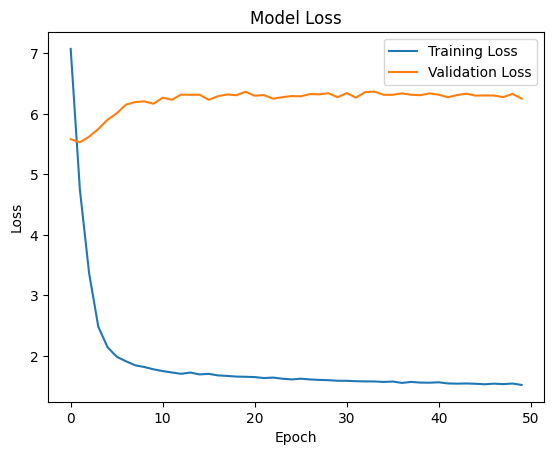

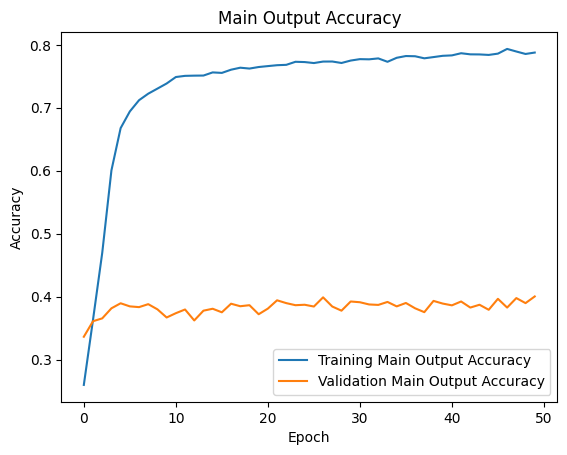

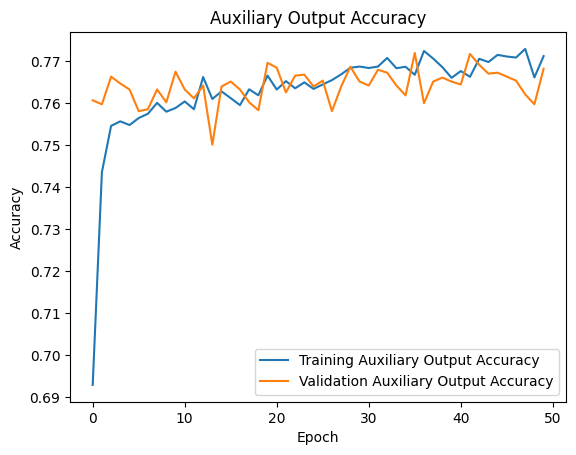

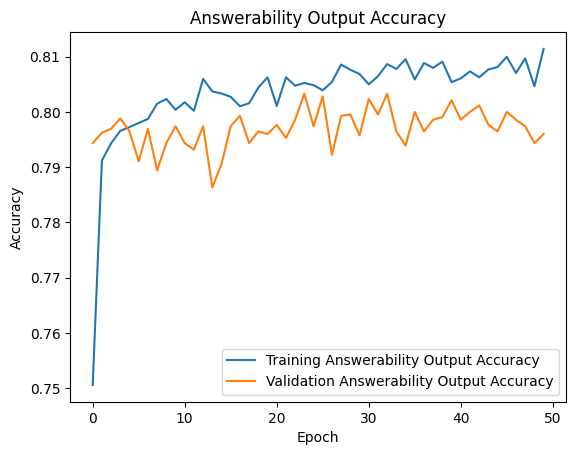

In [54]:
import matplotlib.pyplot as plt

# Loss 
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()


# Main Output Accuracy
plt.plot(history.history['main_output_accuracy'], label='Training Main Output Accuracy')
plt.plot(history.history['val_main_output_accuracy'], label='Validation Main Output Accuracy')
plt.title('Main Output Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

# Auxiliary Output Accuracy
plt.plot(history.history['aux_output_accuracy'], label='Training Auxiliary Output Accuracy')
plt.plot(history.history['val_aux_output_accuracy'], label='Validation Auxiliary Output Accuracy')
plt.title('Auxiliary Output Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

# Auxiliary Output Accuracy
plt.plot(history.history['answerability_output_reshaped_accuracy'], label='Training Answerability Output Accuracy')
plt.plot(history.history['val_answerability_output_reshaped_accuracy'], label='Validation Answerability Output Accuracy')
plt.title('Answerability Output Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()


# Final model metrics results

## Notes on VIZWIZ accuracy calculation

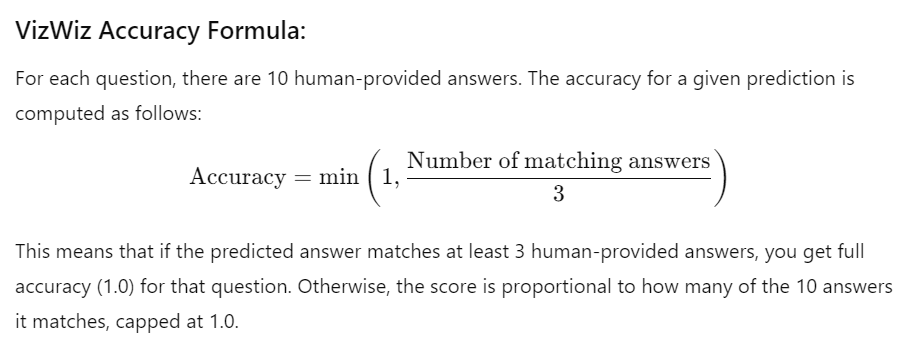

In [78]:
from transformers import AutoTokenizer, CLIPProcessor, CLIPModel
import numpy as np
import tensorflow as tf
import torch

clip_model = CLIPModel.from_pretrained("openai/clip-vit-base-patch32")
tokenizer = AutoTokenizer.from_pretrained("openai/clip-vit-base-patch32")
processor = CLIPProcessor.from_pretrained("openai/clip-vit-base-patch32")

def predict_using_vqa_tensorflow(image_path=None, question=None, image_encoding=None, question_encoding=None):
    if image_path != None:
        image_inputs = processor(images=Image.open(image_path), return_tensors="pt")
        encoded_image = clip_model.get_image_features(**image_inputs)
    else:
        encoded_image = image_encoding
    if question != None:
        question_inputs = tokenizer([question], padding=True, return_tensors="pt")
        encoded_question = clip_model.get_text_features(**question_inputs)
    else:
        encoded_question = question_encoding
    
    encoded_image = torch.tensor(encoded_image).detach().numpy()  # Convert to NumPy array
    encoded_question = torch.tensor(encoded_question).detach().numpy()  # Convert to NumPy array
    
    encoded_image = np.expand_dims(encoded_image, axis=0)  # Add batch dimension if needed
    encoded_question = np.expand_dims(encoded_question, axis=0)  # Add batch dimension if needed
    
    prediction = vqa_tensorflow.predict([encoded_image, encoded_question], verbose=0)

    predicted_answer_class = np.argmax(prediction[0], axis=1)
    predicted_answer_type_class = np.argmax(prediction[1], axis=1)
    
    # top 5 answers
    top_5_answer_class_indices = np.argsort(prediction[0], axis=1)[:, -5:][0][::-1]
    top_5_answers = [index_to_answer[idx] for idx in top_5_answer_class_indices]
    
    return [index_to_answer[predicted_answer_class[0]], index_to_answer_type[predicted_answer_type_class[0]], prediction[2], top_5_answers]

## Results on training data

In [103]:
import matplotlib.pyplot as plt
from PIL import Image

answer_score = 0
vizwiz_score = 0
answer_type_score = 0
answerability_score = 0

for i in range(len(train_dataset)):
    image_encoding = train_dataset[i]['image_encoding']
    question_encoding = train_dataset[i]['question_encoding']
    prediction = predict_using_vqa_tensorflow(image_encoding=image_encoding, question_encoding=question_encoding)
    answers_objects = train_dataset[i]['answers']
    target_answer = train_dataset[i]['chosen_answer']
    target_answer_type = train_dataset[i]['answer_type']
    target_answerability = train_dataset[i]['answerable'][0]
    
    # Calculating standard accuarcy
    if prediction[0] == target_answer:
        answer_score += 1
    
    # Calculating VIZWIZ accuracy 
    prediction_occurences = 0
    
    for obj in answers_objects:
        if prediction[0] == obj['answer']:
            prediction_occurences += 1
    
    vizwiz_score += min(1, prediction_occurences/3)
    
    # Calculating answer type accuracy
    if prediction[1] == target_answer_type:
        answer_type_score += 1
        
    # Calculating answerability accuracy
    if prediction[2][0][0] > 0.5:
        predicted_answerability = 1
    else:
        predicted_answerability = 0
        
    if predicted_answerability == target_answerability:
        answerability_score += 1
    
total_standard_accuracy = answer_score / len(train_dataset)
total_vizwiz_accuracy = vizwiz_score / len(train_dataset)
total_answer_type_accuracy = answer_type_score / len(train_dataset)
total_answerability_accuracy = answerability_score / len(train_dataset)

print(f"Training standard accuracy = {total_standard_accuracy*100:.2f} %")
print(f"Training VIZWIZ accuracy = {total_vizwiz_accuracy*100:.2f} %")
print(f"Training answer type accuracy = {total_answer_type_accuracy*100:.2f} %")
print(f"Training answerability accuracy = {total_answerability_accuracy*100:.2f} %")

Training standard accuracy = 85.35 %
Training VIZWIZ accuracy = 86.52 %
Training answer type accuracy = 80.63 %
Training answerability accuracy = 82.90 %


## Results on validation data

In [88]:
import matplotlib.pyplot as plt
from PIL import Image

answer_score = 0
vizwiz_score = 0
answer_type_score = 0
answerability_score = 0

for i in range(len(val_dataset)):
    image_encoding = val_dataset[i]['image_encoding']
    question_encoding = val_dataset[i]['question_encoding']
    prediction = predict_using_vqa_tensorflow(image_encoding=image_encoding, question_encoding=question_encoding)
    answers_objects = val_dataset[i]['answers']
    target_answer = val_dataset[i]['chosen_answer']
    target_answer_type = val_dataset[i]['answer_type']
    target_answerability = val_dataset[i]['answerable'][0]
    
    # Calculating standard accuarcy
    if prediction[0] == target_answer:
        answer_score += 1
    
    # Calculating VIZWIZ accuracy 
    prediction_occurences = 0
    
    for obj in answers_objects:
        if prediction[0] == obj['answer']:
            prediction_occurences += 1
    
    vizwiz_score += min(1, prediction_occurences/3)
    
    # Calculating answer type accuracy
    if prediction[1] == target_answer_type:
        answer_type_score += 1
        
    # Calculating answerability accuracy
    if prediction[2][0][0] > 0.5:
        predicted_answerability = 1
    else:
        predicted_answerability = 0
        
    if predicted_answerability == target_answerability:
        answerability_score += 1
    
total_standard_accuracy = answer_score / len(val_dataset)
total_vizwiz_accuracy = vizwiz_score / len(val_dataset)
total_answer_type_accuracy = answer_type_score / len(val_dataset)
total_answerability_accuracy = answerability_score / len(val_dataset)

print(f"Validation standard accuracy = {total_standard_accuracy*100:.2f} %")
print(f"Validation VIZWIZ accuracy = {total_vizwiz_accuracy*100:.2f} %")
print(f"Validation answer type accuracy = {total_answer_type_accuracy*100:.2f} %")
print(f"Validation answerability accuracy = {total_answerability_accuracy*100:.2f} %")

Validation standard accuracy = 40.02 %
Validation VIZWIZ accuracy = 52.18 %
Validation answer type accuracy = 76.82 %
Validation answerability accuracy = 79.60 %


# Sample inferences on validation and test data

## Note on inferences

**We display inferences that are not unanswerable, unsuitable, or unsuitable image, since they are overrepresented, and most of the model's evaluation mistakes are confusing all 3 of those classes, since they are not easily differentiable.**

## Inferences on validation data

/tmp/ipykernel_35/1667454026.py:22: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  encoded_image = torch.tensor(encoded_image).detach().numpy()  # Convert to NumPy array
/tmp/ipykernel_35/1667454026.py:23: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  encoded_question = torch.tensor(encoded_question).detach().numpy()  # Convert to NumPy array


question: Can you tell me what this medicine is please?
predicted answer: night time
expected answer: unsuitable image
predicted answer type: other


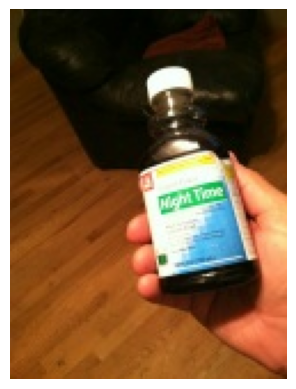

---------------------------------------------------------------
question: Which one is the blue one?
predicted answer: right
expected answer: right
predicted answer type: other


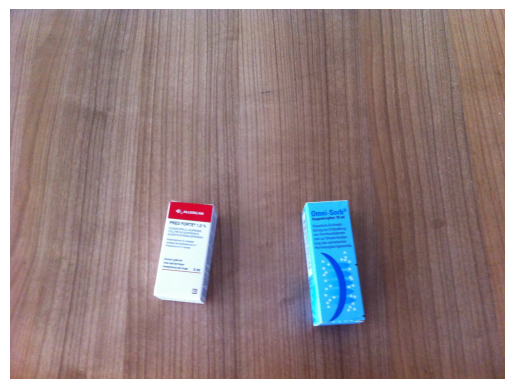

---------------------------------------------------------------
question: What color is this
predicted answer: white
expected answer: white
predicted answer type: other


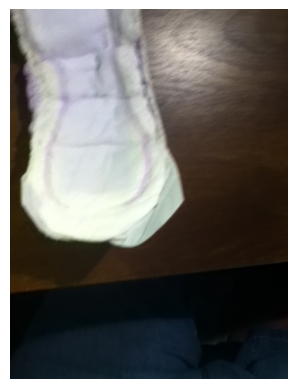

---------------------------------------------------------------
question: Which one of these items is the children's dictionary? Is it the one on the right, or the one on the left?
predicted answer: right
expected answer: left
predicted answer type: other


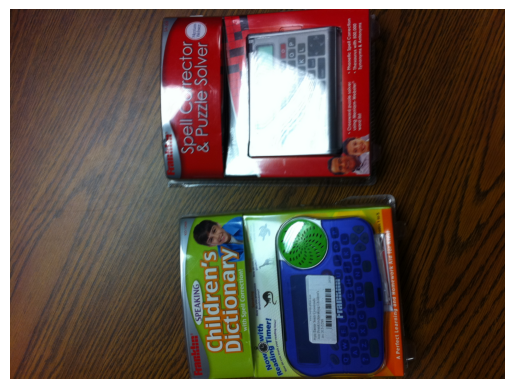

---------------------------------------------------------------
question: What is the computer doing?
predicted answer: laptop
expected answer: unanswerable
predicted answer type: other


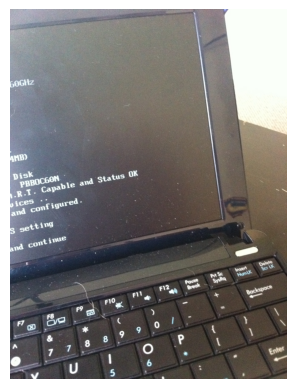

---------------------------------------------------------------
question: I was wondering how ominous the sky is looking here at the northwest.
predicted answer: yes
expected answer: unanswerable
predicted answer type: yes/no


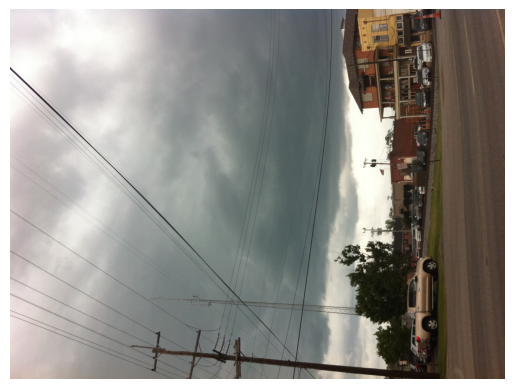

---------------------------------------------------------------
question: Can you tell me what this is a picture of?
predicted answer: computer screen
expected answer: unanswerable
predicted answer type: other


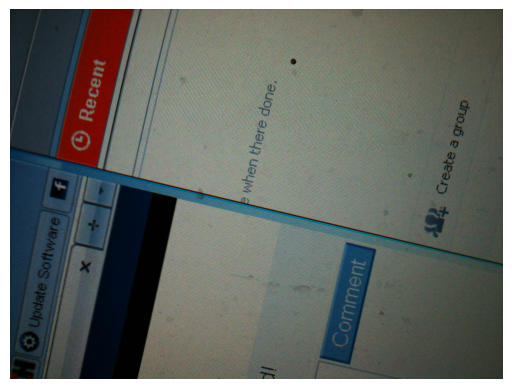

---------------------------------------------------------------
question: What store is this?
predicted answer: original pancake house
expected answer: original pancake house
predicted answer type: other


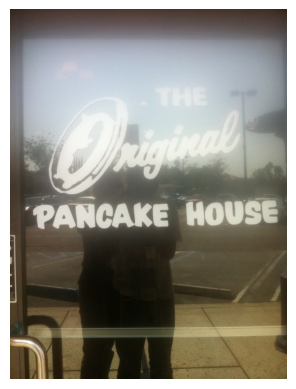

---------------------------------------------------------------
question: What's the name of the drink?
predicted answer: water
expected answer: irn bru
predicted answer type: other


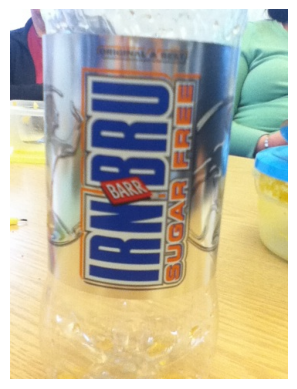

---------------------------------------------------------------
question: What is this?
predicted answer: keyboard
expected answer: unanswerable
predicted answer type: other


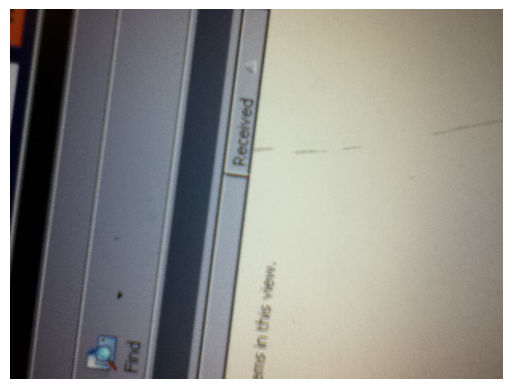

---------------------------------------------------------------
question: What is the person doing?
predicted answer: looking at computer screen
expected answer: looking at computer
predicted answer type: unanswerable


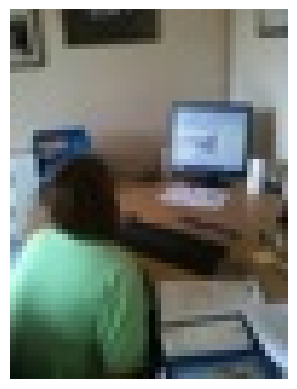

---------------------------------------------------------------
question: what does the sky look like in this photograph
predicted answer: clear
expected answer: clear
predicted answer type: other


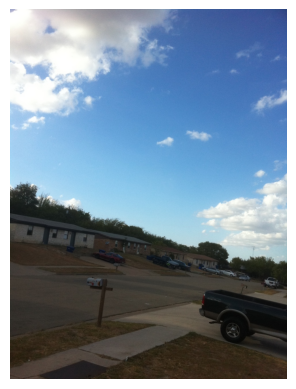

---------------------------------------------------------------
question: Can you please tell me what the computer screen says within in the VMware workstation window?  Particular to see if there's any progress on the Windows installation.
predicted answer: windows
expected answer: unanswerable
predicted answer type: unanswerable


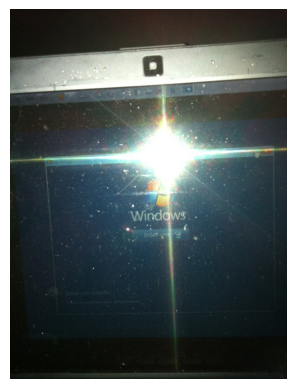

---------------------------------------------------------------
question: Is this caffeinated or decaffeinated?
predicted answer: pepsi
expected answer: caffeinated
predicted answer type: other


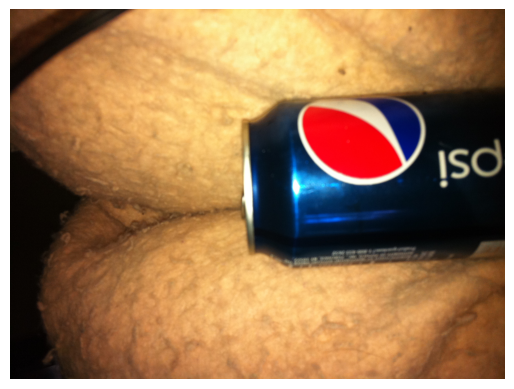

---------------------------------------------------------------
question: Please describe this page. Thank you.
predicted answer: store ad
expected answer: ad
predicted answer type: other


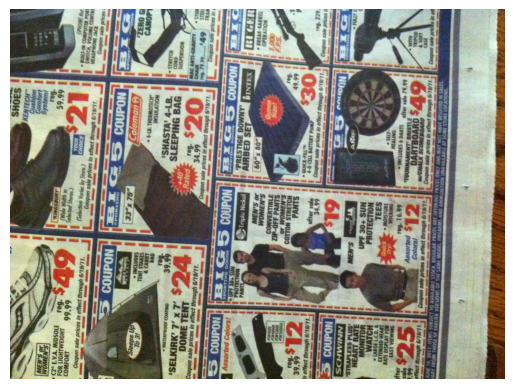

---------------------------------------------------------------
question: What drink is this?
predicted answer: water
expected answer: hint blackberry
predicted answer type: other


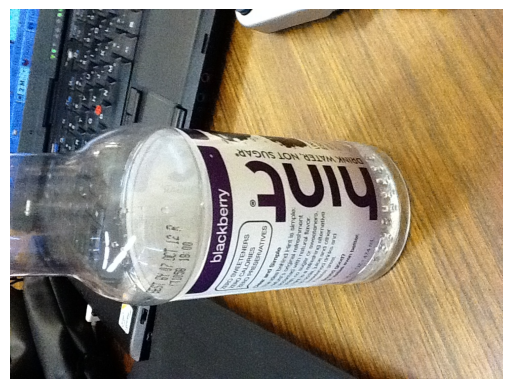

---------------------------------------------------------------
question: Can you tell me what this is a picture of?
predicted answer: computer screen
expected answer: computer screen
predicted answer type: other


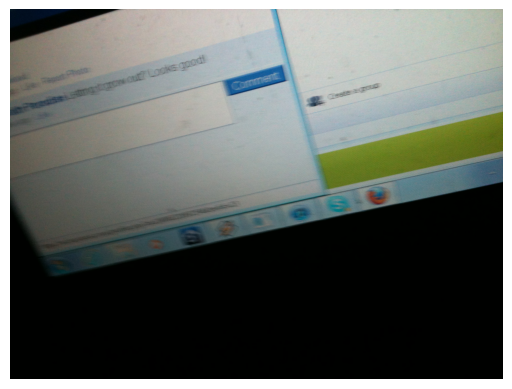

---------------------------------------------------------------
question: What is this?
predicted answer: computer screen
expected answer: skype
predicted answer type: other


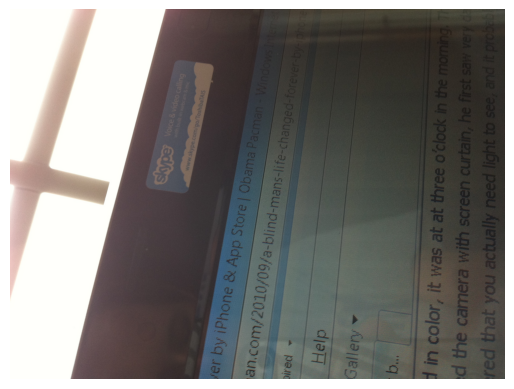

---------------------------------------------------------------
question: Can you tell me which medicine this is please?
predicted answer: night time
expected answer: night time
predicted answer type: other


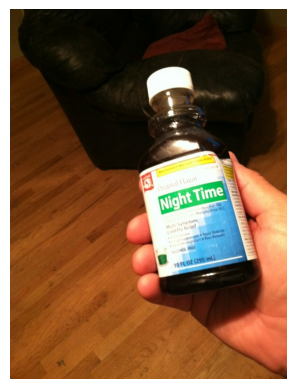

---------------------------------------------------------------
question: What is in this picture?
predicted answer: tv
expected answer: tv
predicted answer type: other


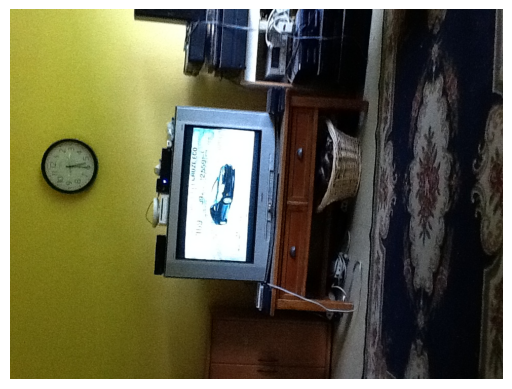

---------------------------------------------------------------
question: What does the computer screen say?
predicted answer: cancel
expected answer: unsuitable image
predicted answer type: unanswerable


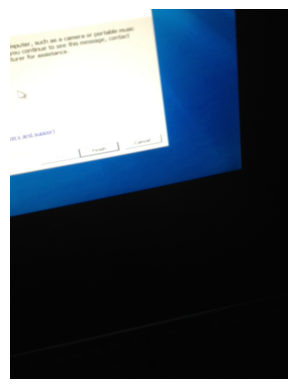

---------------------------------------------------------------
question: What color is this skirt?
predicted answer: blue
expected answer: blue
predicted answer type: other


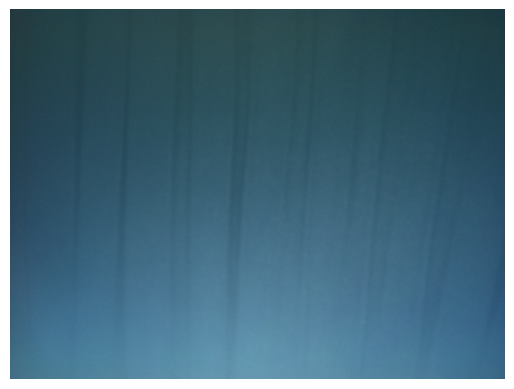

---------------------------------------------------------------
question: clouds in the sky look like
predicted answer: yes
expected answer: white
predicted answer type: yes/no


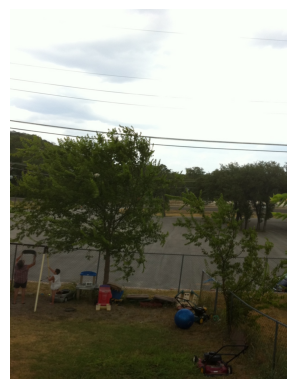

---------------------------------------------------------------
question: What is this?
predicted answer: tv
expected answer: computer
predicted answer type: other


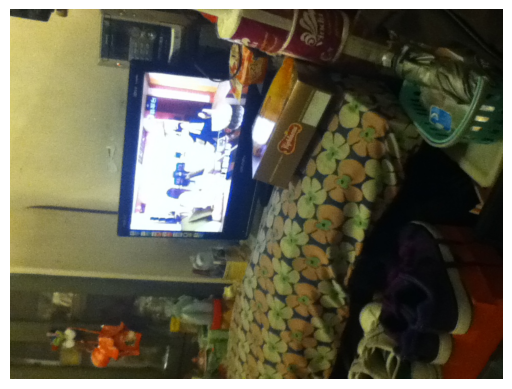

---------------------------------------------------------------
question: Can you please tell me the 1-800 number on this card?
predicted answer: 1 877 328 9677
expected answer: 1 877 328 9677
predicted answer type: other


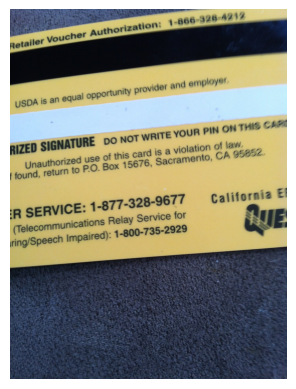

---------------------------------------------------------------
question: Do the clouds look like storm clouds?
predicted answer: yes
expected answer: no
predicted answer type: other


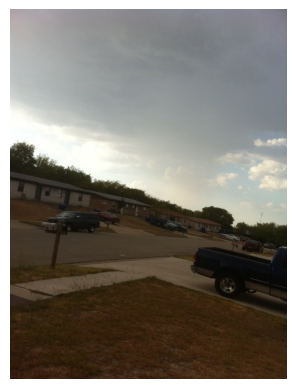

---------------------------------------------------------------
question: Can you describe what is on the case of this DVD?
predicted answer: harry potter
expected answer: no
predicted answer type: unanswerable


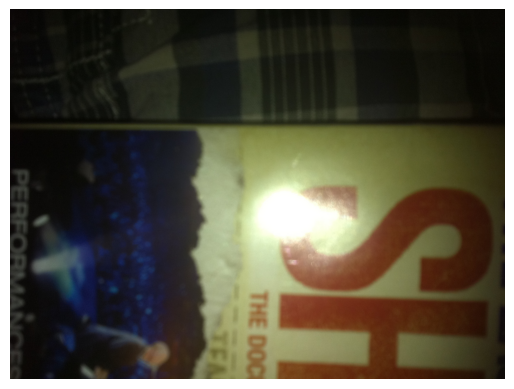

---------------------------------------------------------------
question: Ok.  This is a picture with a different angle.  Do you see another an id number now with the RT systems software?
predicted answer: no
expected answer: no
predicted answer type: yes/no


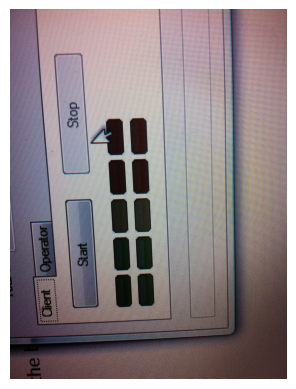

---------------------------------------------------------------
question: What is the person doing?
predicted answer: looking at computer screen
expected answer: looking at computer screen
predicted answer type: other


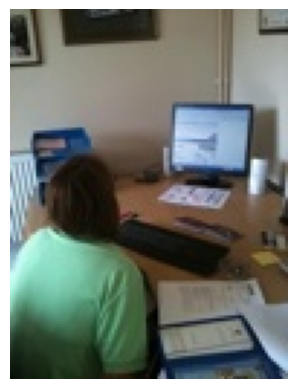

---------------------------------------------------------------
question: Hi, what do you see in the screen?
predicted answer: computer screen
expected answer: unsuitable image
predicted answer type: other


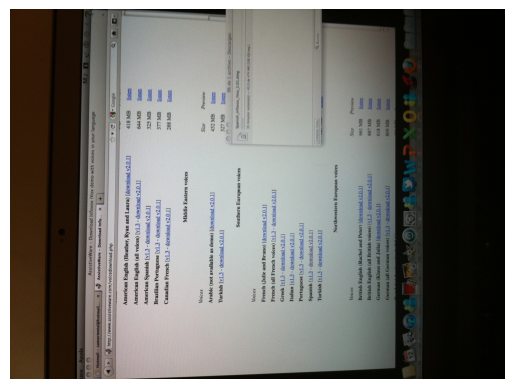

---------------------------------------------------------------


In [99]:
import matplotlib.pyplot as plt
from PIL import Image

i = 0
j = 0
while i < 30:
    image_path = f"/kaggle/input/vizwiz/val/val/{val_dataset[j]['image']}"
    image = Image.open(image_path)
    question = val_dataset[j]['question']
    prediction = predict_using_vqa_tensorflow(image_path, question)
    answer = val_dataset[j]['chosen_answer']
    
    if prediction[0] not in ['unanswerable', 'unsuitable', 'unsuitable image']:
        print(f"question: {question}")
        print(f"predicted answer: {prediction[0]}")
        print(f"expected answer: {answer}") 
        print(f"predicted answer type: {prediction[1]}")
        plt.imshow(image)
        plt.axis('off')
        plt.show()
        print("---------------------------------------------------------------")
        i += 1
    j += 1

## Inferences on test data

/tmp/ipykernel_35/1667454026.py:22: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  encoded_image = torch.tensor(encoded_image).detach().numpy()  # Convert to NumPy array
/tmp/ipykernel_35/1667454026.py:23: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  encoded_question = torch.tensor(encoded_question).detach().numpy()  # Convert to NumPy array


question: What is this? And what color is it?
predicted answer: black
predicted answer type: other


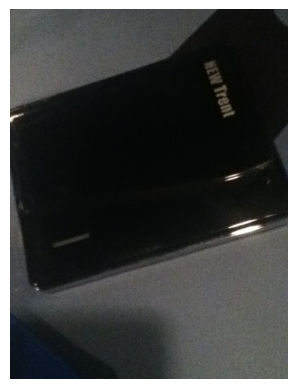

---------------------------------------------------------------
question: What is this?
predicted answer: laptop
predicted answer type: other


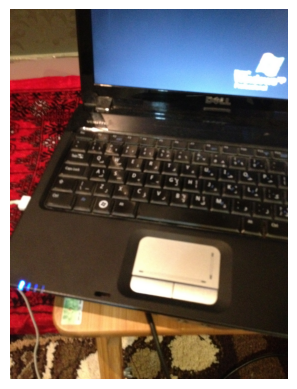

---------------------------------------------------------------
question: What is this?
predicted answer: half half
predicted answer type: other


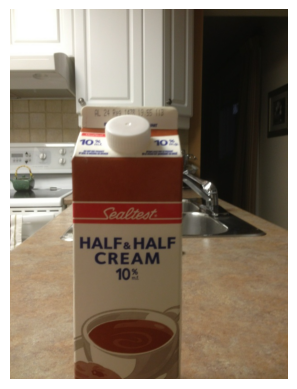

---------------------------------------------------------------
question: Do these beans look like black beans or pinto beans?
predicted answer: yes
predicted answer type: other


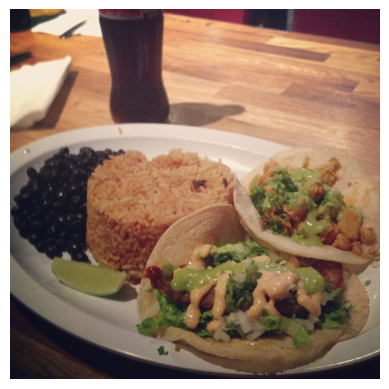

---------------------------------------------------------------
question: what is this?
predicted answer: stove
predicted answer type: other


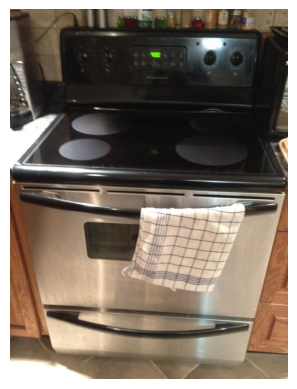

---------------------------------------------------------------
question: What color are these two connectors?
predicted answer: black blue
predicted answer type: other


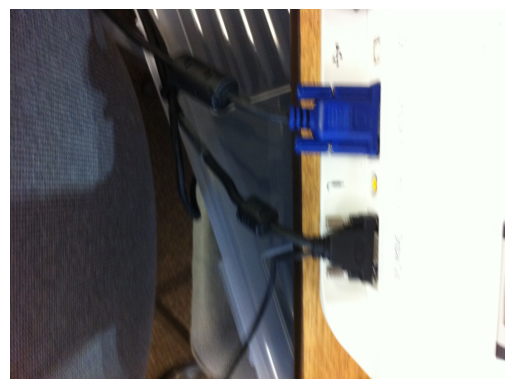

---------------------------------------------------------------
question: Which cereal is this?  Question mark.
predicted answer: cheerios
predicted answer type: other


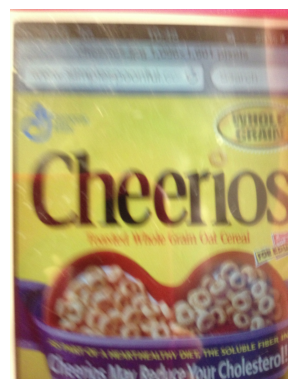

---------------------------------------------------------------
question: What room is this?
predicted answer: 216
predicted answer type: other


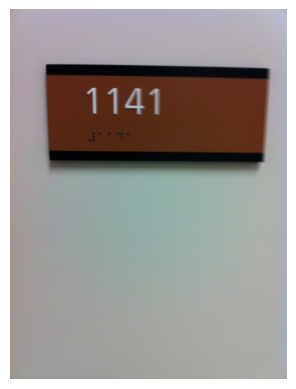

---------------------------------------------------------------
question: What kind of coffee is this?
predicted answer: vanilla hazelnut
predicted answer type: other


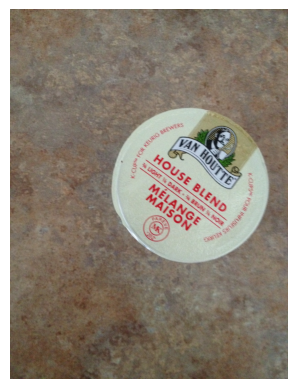

---------------------------------------------------------------
question: What is this?
predicted answer: keyboard
predicted answer type: other


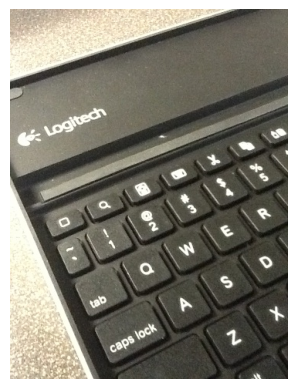

---------------------------------------------------------------
question: How does this picture look of my tree, question mark?
predicted answer: good
predicted answer type: yes/no


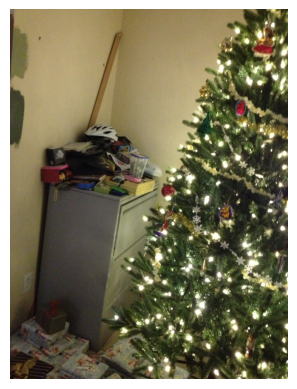

---------------------------------------------------------------
question: What color are my shoes?
predicted answer: brown
predicted answer type: other


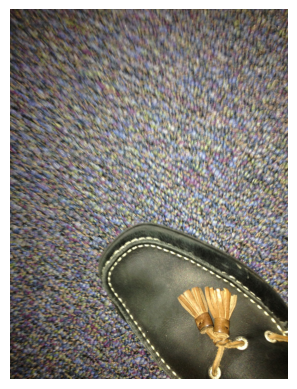

---------------------------------------------------------------
question: What is in this cup? What is in this cup?
predicted answer: milk
predicted answer type: other


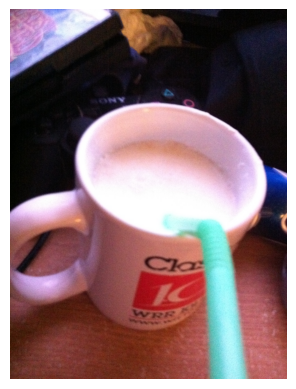

---------------------------------------------------------------
question: What is this?
predicted answer: cup
predicted answer type: other


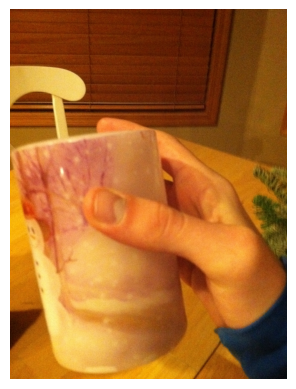

---------------------------------------------------------------
question: what color is this?
predicted answer: grey
predicted answer type: other


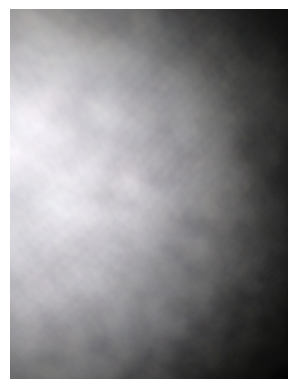

---------------------------------------------------------------
question: what does this photo say?
predicted answer: 4ycjfw8l
predicted answer type: other


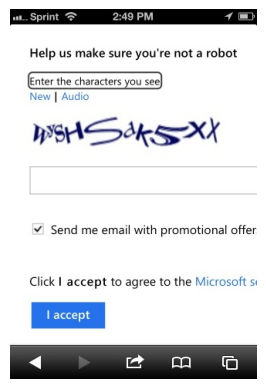

---------------------------------------------------------------
question: What kind of TV dinner is this?
predicted answer: chicken parmesan
predicted answer type: other


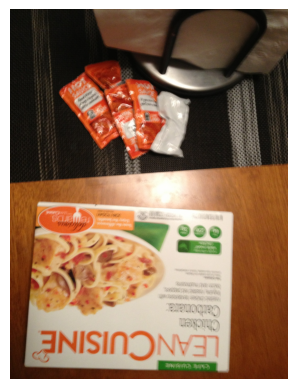

---------------------------------------------------------------
question: Can you tell me what flavor this is?
predicted answer: chocolate
predicted answer type: other


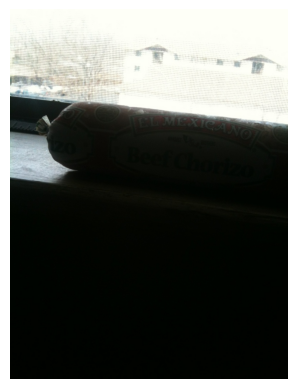

---------------------------------------------------------------
question: What is this can?
predicted answer: black beans
predicted answer type: other


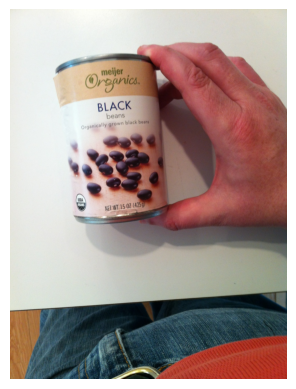

---------------------------------------------------------------
question: Is this a shredder
predicted answer: yes
predicted answer type: unanswerable


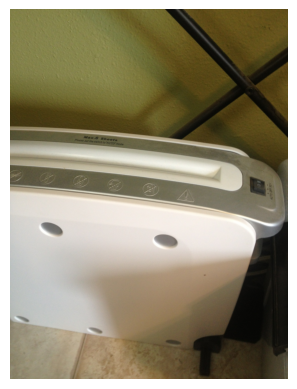

---------------------------------------------------------------
question: What is this?
predicted answer: pen
predicted answer type: other


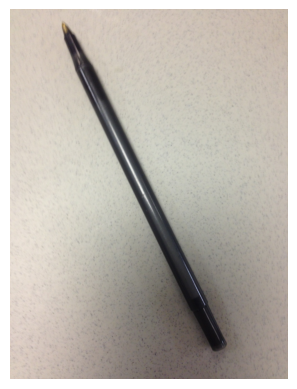

---------------------------------------------------------------
question: Does this say readers brand of beef dinner?
predicted answer: breeder blend
predicted answer type: other


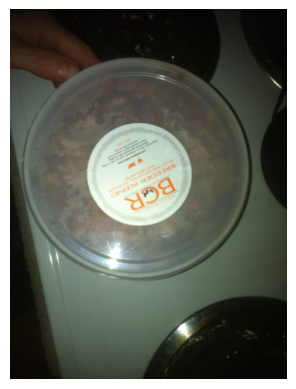

---------------------------------------------------------------
question: What color is this skirt?
predicted answer: brown
predicted answer type: other


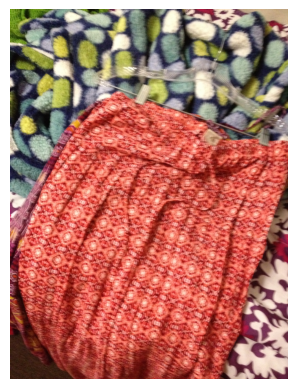

---------------------------------------------------------------
question: What is that?
predicted answer: laptop
predicted answer type: other


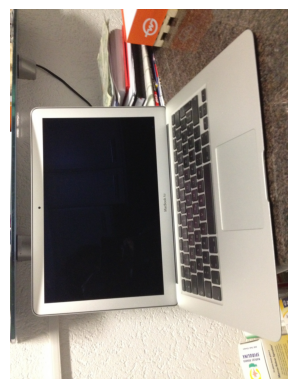

---------------------------------------------------------------
question: Can you tell me if you see my keys anywhere?  Thanks.
predicted answer: no
predicted answer type: other


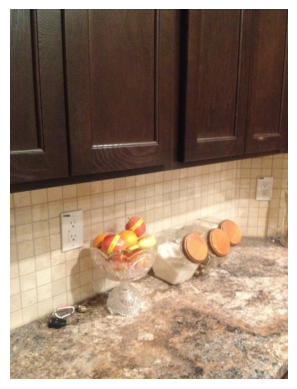

---------------------------------------------------------------
question: What is this?
predicted answer: coffee
predicted answer type: other


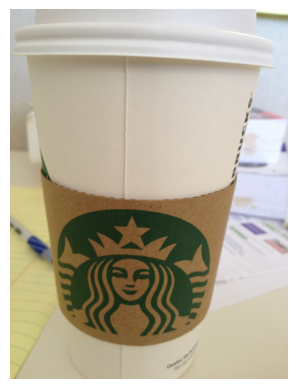

---------------------------------------------------------------
question: What is this bottle?
predicted answer: lotion
predicted answer type: other


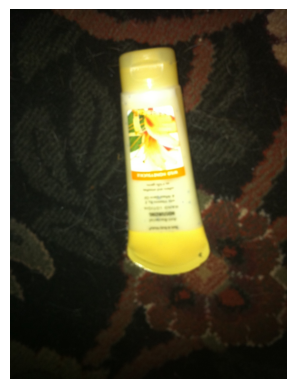

---------------------------------------------------------------
question: What is this?
predicted answer: water bottle
predicted answer type: other


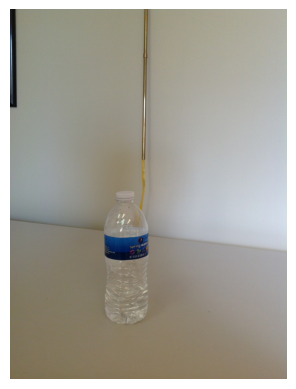

---------------------------------------------------------------
question: What is that bill
predicted answer: 5
predicted answer type: other


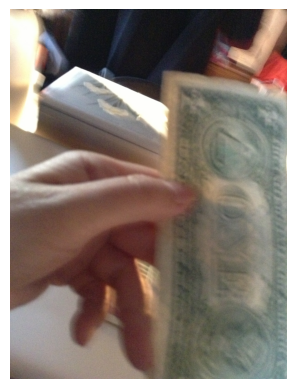

---------------------------------------------------------------
question: What color is this?
predicted answer: white
predicted answer type: other


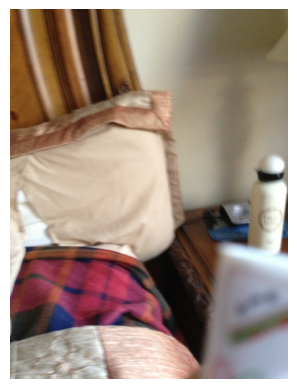

---------------------------------------------------------------


In [100]:
import matplotlib.pyplot as plt
from PIL import Image

i = 0
j = 0
while i < 30:
    image_path = f"/kaggle/input/vizwiz/test/test/{test_dataset['train'][j]['image']}"
    image = Image.open(image_path)
    question = test_dataset['train'][j]['question']
    prediction = predict_using_vqa_tensorflow(image_path, question)
    
    if prediction[0] not in ['unanswerable', 'unsuitable', 'unsuitable image']:
        print(f"question: {question}")
        print(f"predicted answer: {prediction[0]}")
        print(f"predicted answer type: {prediction[1]}")
        plt.imshow(image)
        plt.axis('off')
        plt.show()
        print("---------------------------------------------------------------")
        i += 1
    j += 1